# Проект: Обучение модели детекции на основе сгенерированной разметки

**Цель:** Обучить детектор людей без шлема, используя синтетическую разметку, сгенерированную VQA-моделью (через vLLM).

In [27]:
# Импорт зависимостей

from pathlib import Path
import re
from io import BytesIO
import base64
import json
import random
import shutil

import matplotlib.image as mpimg
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
from openai import AsyncOpenAI
from PIL import Image
from pydantic import BaseModel, Field
from ultralytics import YOLO
import torch
from IPython.display import Image as IPyImage, display
import numpy as np
import csv

## Этап 1. Генерация разметки

### Загрузка датасета и визуализация примеров

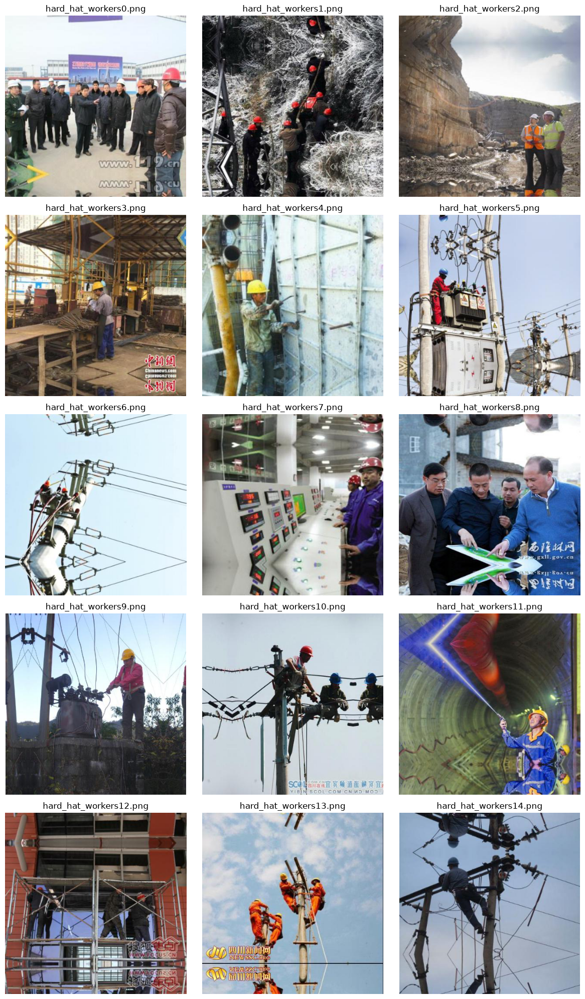

In [13]:
DATA_DIR = Path("images")
ARTIFACTS_DIR = Path("artifacts")

img_paths = sorted(
    DATA_DIR.glob("*.png"),
    key=lambda p: int(re.search(r"\d+", p.stem).group()) if re.search(r"\d+", p.stem) else p.stem,
)

n = min(len(img_paths), 15)
cols = 3
rows = (n + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows))
axes = axes.flatten() if n > 1 else [axes]
for ax, path in zip(axes, img_paths[:n]):
    ax.imshow(mpimg.imread(path))
    ax.set_title(path.name)
    ax.axis("off")
for ax in axes[n:]:
    ax.axis("off")
plt.tight_layout()
plt.show()

Качество изображений среднее, изображения сами по себе небольшие. Часто присуствует зеркальная склейка, поверх кадра встречаются водяные знаки. Шлемы разных цветов в разнообразных ракурсах. На изображениях иногда присутствуют толпы людей (>10 человек в кадре). VQA на таких кадрах скорее пропустит мелких людей в толпе, перепутает человека в каске с человеком без неё или нарисует лишнюю рамку на предмете и зеркальной склейке.

### Выбор VQA-модели и промпт

За первоначальной разметки возьмем VQA-модель `qwen/qwen3-vl-30b` хорошо обученную на детекцию объектов на изображении и определение их bounding box.

Для этого предварительно на локальной машине развернем OpenAI-совместимый сервер через vLLM cli:
```
vllm serve qwen/qwen3-vl-30b --trust-remote-code --limit-mm-per-prompt image=1 --port 1234
```

Таким образом у нас будет возможность получить структурный ответ от модели.

In [14]:
# Порт и id модели vLLM
VLLM_BASE_URL = "http://127.0.0.1:1234/v1"
VLLM_MODEL_NAME = "qwen/qwen3-vl-30b"

Промпт на извлечение рамок из изображений

In [15]:
EXTRACTION_PROMPT = """
Extract all people with and without safety helmet on with its bounding boxes on related image
Bounding box coordinates are in 0-1000 relative to image width and height.
x1,y1 is top-left, x2,y2 is bottom-right.
List each person once. At most 40 people. Output one JSON object and stop.

Output format:
{
    persons: [
        {
            "has_helmet": bool,
            "bbox": {
                "x1": float,
                "y1": float,
                "x2": float,
                "y2": float,
            }
        }
    ]
}
"""

Подключаемся через клиент к vLLM и получаем структурный ответ для каждого изображения

In [16]:
VQA_MAX_SIZE = (512, 512)
TEMPERATURE = 0.0
MAX_TOKENS = 2048
MAX_PERSONS = 40
MAX_ATTEMPTS = 3

client = AsyncOpenAI(
    api_key="-",
    base_url=VLLM_BASE_URL,
)


class BoundingBoxXYWH(BaseModel):
    """Bounding box in [x_min, y_min, width, height] format."""
    x1: float = Field(..., description="Top-left x, 0-1000")
    y1: float = Field(..., description="Top-left y, 0-1000")
    x2: float = Field(..., description="Bottom-right x, 0-1000")
    y2: float = Field(..., description="Bottom-right y, 0-1000")


class Person(BaseModel):
    has_helmet: bool = Field(..., description="Indicates if the person is wearing a safety helmet")
    bbox: BoundingBoxXYWH = Field(..., description="Bounding box")


class PersonsResponse(BaseModel):
    persons: list[Person] = Field(..., max_length=MAX_PERSONS)


async def inference_vqa(prompt: str, img_data_url: str) -> PersonsResponse | None:
    for _ in range(MAX_ATTEMPTS):
        try:
            completion = await client.chat.completions.create(
                model=VLLM_MODEL_NAME,
                messages=[
                    {
                        "role": "user",
                        "content": [
                            {
                                "type": "text",
                                "text": prompt,
                            },
                            {
                                "type": "image_url",
                                "image_url": {
                                    "url": img_data_url,
                                },
                            },
                        ],
                    }
                ],
                temperature=TEMPERATURE,
                max_tokens=MAX_TOKENS,
                response_format={
                    "type": "json_schema",
                    "json_schema": {
                        "name": "hats-detection",
                        "schema": PersonsResponse.model_json_schema(),
                    },
                },
            )
            content = completion.choices[0].message.content
            return PersonsResponse.model_validate_json(content)
        except Exception as e:
            print(f"Error: {e}")
            continue
    print(f"Error: failed to load response after {MAX_ATTEMPTS} attempts")
    return None


def encode_image(img_path: Path) -> str:
    img = Image.open(img_path)
    img.thumbnail(VQA_MAX_SIZE, Image.Resampling.LANCZOS)
    buffered = BytesIO()
    img.save(buffered, format="PNG")
    b64_img = base64.b64encode(buffered.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{b64_img}"

### Извлечение разметки и приведение к формату детектора

Напишем парсер, который преобразует JSON-ответы от VQA в формат аннотаций YOLO (class x_center y_center width height, значения в диапазоне 0–1) и создаст необходимые файлы `.txt` для обучения.

In [17]:
# модель имеет тенденцию выдавать числа от 0 до 1000, нормируем из в диапазон 0-1
BBOX_SCALE = 1000.0


def _bbox_to_norm(x1, y1, x2, y2):
    x1 = max(0, min(1, x1 / BBOX_SCALE))
    y1 = max(0, min(1, y1 / BBOX_SCALE))
    x2 = max(0, min(1, x2 / BBOX_SCALE))
    y2 = max(0, min(1, y2 / BBOX_SCALE))

    center_x = (x1 + x2) / 2
    center_y = (y1 + y2) / 2
    width = x2 - x1
    height = y2 - y1

    return center_x, center_y, width, height


def save_yolo_annotation(img_path: Path, response: PersonsResponse):
    annotation_path = img_path.with_suffix(".txt")
    raw_response_path = img_path.with_suffix(".json")

    with open(raw_response_path, "w", encoding="utf-8") as f:
        json.dump(response.model_dump(), f, indent=4)

    with open(annotation_path, "w", encoding="utf-8") as f:
        for person in response.persons:
            class_id = "1" if person.has_helmet else "0"
            bbox = person.bbox
            f.write(
                f"{class_id} {' '.join(str(x) for x in _bbox_to_norm(bbox.x1, bbox.y1, bbox.x2, bbox.y2))}\n"
            )

In [18]:
async def process_image(img_path: Path) -> None:
    if not img_path.exists():
        raise FileNotFoundError
    if img_path.with_suffix(".txt").exists():
        return

    img_data_url = encode_image(img_path)
    response = await inference_vqa(EXTRACTION_PROMPT, img_data_url)
    if response is None:
        return

    save_yolo_annotation(img_path, response)

# for p in img_paths:
#     await process_image(p)

### Оценка качества полученной разметки

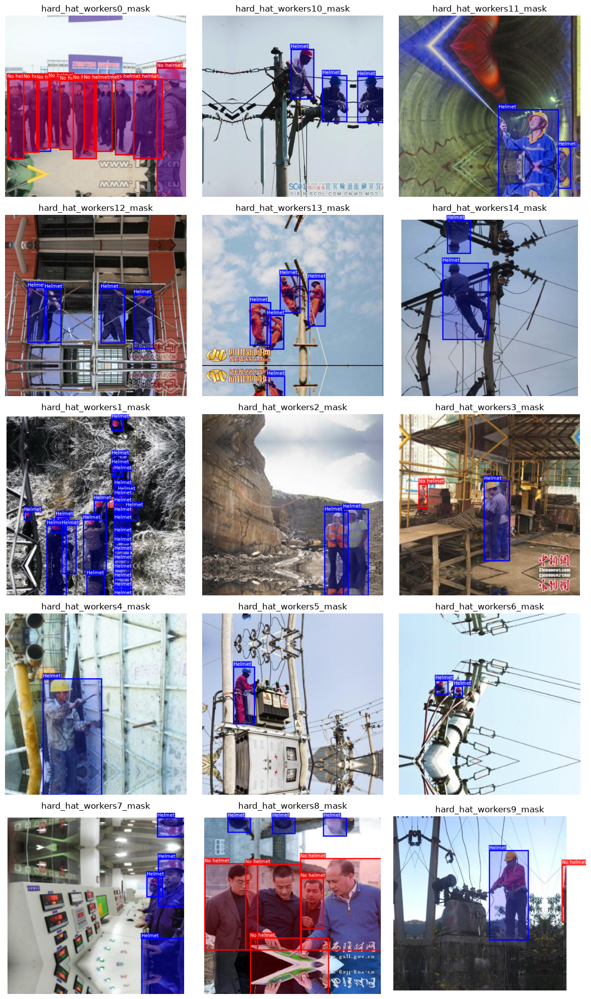

In [19]:
CLASSES_COLORS = {
    "0": (1.0, 0.0, 0.0),  # нет шлема
    "1": (0.0, 0.0, 1.0),  # есть шлем
}


def draw_masks(img_path: str, img_stem: str, persons: list[Person]):
    ARTIFACTS_DIR.mkdir(parents=True, exist_ok=True)
    mask_path = ARTIFACTS_DIR / f"{img_stem}_mask.png"

    img = mpimg.imread(img_path)
    img_h, img_w = img.shape[:2]
    fig, ax = plt.subplots(figsize=(img_w / 100, img_h / 100), dpi=100)
    ax.imshow(img)
    ax.set_axis_off()
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

    for person in persons:
        bbox = person.bbox
        helmet_color = CLASSES_COLORS["1" if person.has_helmet else "0"]
        helmet_caption = "Helmet" if person.has_helmet else "No helmet"
        x1, y1 = bbox.x1 / BBOX_SCALE * img_w, bbox.y1 / BBOX_SCALE * img_h
        x2, y2 = bbox.x2 / BBOX_SCALE * img_w, bbox.y2 / BBOX_SCALE * img_h
        w, h = x2 - x1, y2 - y1
        ax.add_patch(Rectangle(
            (x1, y1), w, h,
            fill=True,
            facecolor=(*helmet_color, 0.2),
            edgecolor=(*helmet_color, 1.0),
            linewidth=2,
        ))
        ax.text(
            x1,
            y1,
            helmet_caption,
            color="white",
            fontsize=8,
            va="bottom",
            bbox={"facecolor": helmet_color, "edgecolor": "none", "alpha": 0.8, "pad": 1},
        )

    fig.savefig(mask_path, bbox_inches="tight", pad_inches=0)
    plt.close(fig)


mask_paths = sorted(ARTIFACTS_DIR.glob("*_mask.png"))

if mask_paths:
    n = min(len(mask_paths), 15)
    cols = 3
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows))
    axes = axes.flatten() if n > 1 else [axes]
    for ax, path in zip(axes, mask_paths[:n]):
        ax.imshow(mpimg.imread(path))
        ax.set_title(path.stem)
        ax.axis("off")
    for ax in axes[n:]:
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(ARTIFACTS_DIR / "vqa_results.png")
    plt.show()

Разметили **1001** кадр датасета. Всего получилось **10664** бокса: **3270** — без шлема и **7394** в шлеме. Пустых файлов нет, на кадре от 1 до 40 человек.

На выборке оверлеев (первые 15 кадров):
- крупные люди в каске разпознаются уверенно
- ошибка класса человек в каске иногда помечается как без шлема
- ложные детекции — предметы принимаются за человека
- зеркало и водяной знак модель иногда игнорирует, иногда нет

Потолок обучения далее будет упираться в качество полученной разметки.

## Этап 2. Обучение модели детекции

### Подготовка данных и настройка модели

Готовим структуру папок (`train`/`val`), файл `data.yaml`. Делаем сплит 80/20.

In [20]:
OUTPUT_DIR = Path("datasets/hardhat")

VAL_RATIO = 0.2
SEED = 42

CLASS_NAMES = {
    0: "no_helmet",
    1: "helmet"
}

def collect_pairs(images_dir: Path) -> list[tuple[Path, Path]]:
    pairs = []
    for img_path in images_dir.glob("*.png"):
        label_path = img_path.with_suffix(".txt")
        if label_path.exists():
            pairs.append((img_path, label_path))
    return pairs


def split_pairs(pairs: list[tuple[Path, Path]]):
    pairs = pairs.copy()
    random.Random(SEED).shuffle(pairs)
    val_count = max(1, int(len(pairs) * VAL_RATIO)) if len(pairs) > 1 else 0
    return pairs[val_count:], pairs[:val_count]


def copy_split(pairs: list[tuple[Path, Path]], output_dir: Path, split_name: str):
    images_out = output_dir / "images" / split_name
    labels_out = output_dir / "labels" / split_name
    images_out.mkdir(parents=True, exist_ok=True)
    labels_out.mkdir(parents=True, exist_ok=True)
    for img_path, label_path in pairs:
        shutil.copy2(img_path, images_out / img_path.name)
        shutil.copy2(label_path, labels_out / label_path.name)


def write_data_yaml(output_dir: Path) -> None:
    names = "\n".join(f"  {idx}: {name}" for idx, name in CLASS_NAMES.items())
    content = (
        f"path: .\n"
        f"train: images/train\n"
        f"val: images/val\n"
        f"names:\n{names}\n"
    )
    (output_dir / "data.yaml").write_text(content, encoding="utf-8")


def prepare_dataset():
    pairs = collect_pairs(DATA_DIR)
    if not pairs:
        raise SystemExit(f"Не достаточно пар image+txt в {DATA_DIR}")

    if OUTPUT_DIR.exists():
        shutil.rmtree(OUTPUT_DIR)

    train_pairs, val_pairs = split_pairs(pairs)
    copy_split(train_pairs, OUTPUT_DIR, "train")
    copy_split(val_pairs, OUTPUT_DIR, "val")
    write_data_yaml(OUTPUT_DIR)

    print(f"train: {len(train_pairs)}, val: {len(val_pairs)}")
    print(f"data.yaml: {OUTPUT_DIR / 'data.yaml'}")

# prepare_dataset()

Параметры обучения YOLO: модель — `yolo26n`, 100 эпох, размер изображения — 512 пикселей.

In [21]:
def train():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    model = YOLO("yolo26n.pt")
    
    results = model.train(
        data=OUTPUT_DIR / "data.yaml",
        epochs=100,
        imgsz=512,
        device=device,
        project=str(ARTIFACTS_DIR / "yolo"),
        name="train",
        exist_ok=True,
        plots=True,
    )

# train()

### Анализ результатов обучения

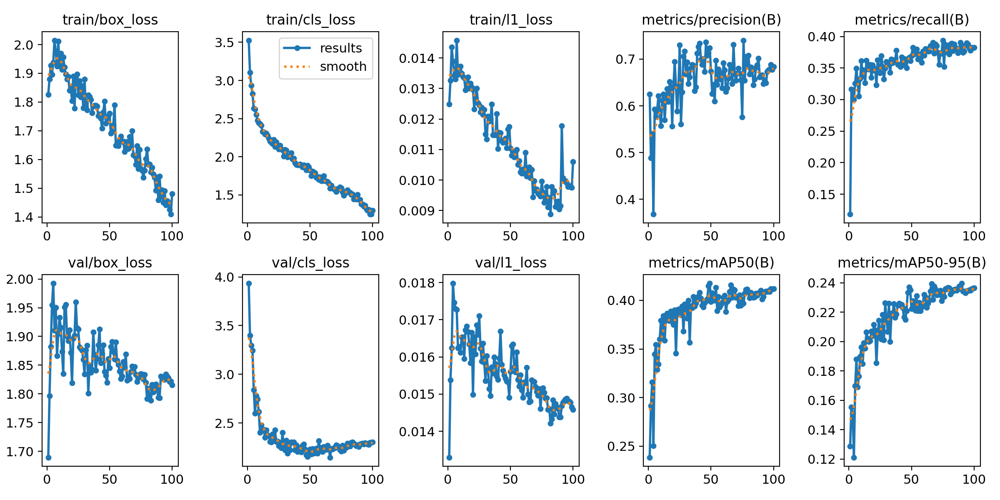

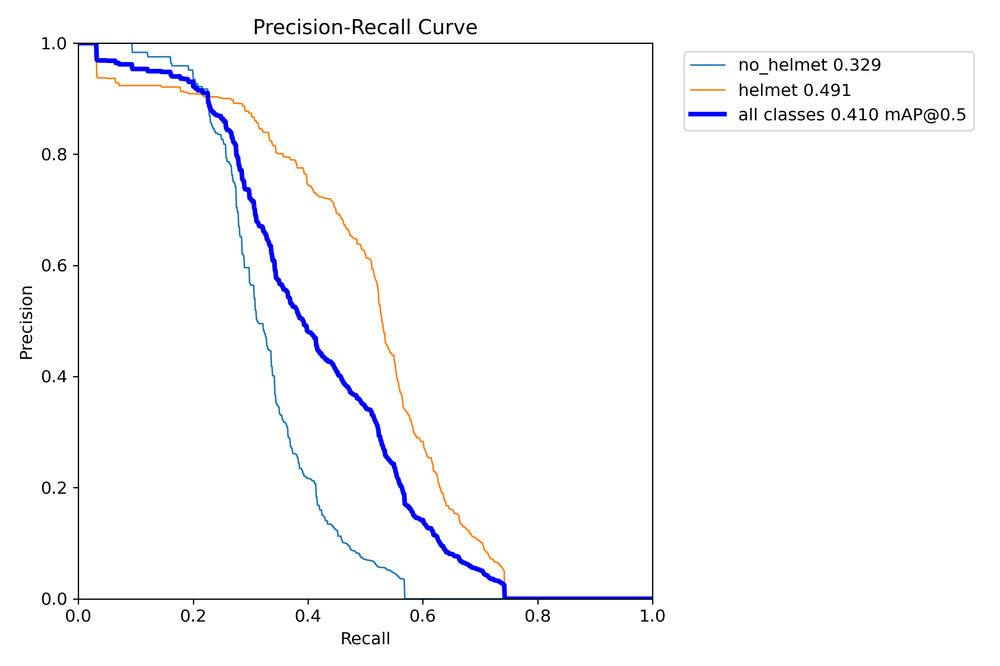

last epoch: 100
train/box_loss: 1.48039
train/cls_loss: 1.29796
train/l1_loss: 0.0106
metrics/mAP50(B): 0.41176
metrics/mAP50-95(B): 0.2365
val/box_loss: 1.81586
val/cls_loss: 2.30391
val/l1_loss: 0.01458


In [31]:
# Получим артефакты, созданные при обучении YOLO
RUN_DIR = ARTIFACTS_DIR / "yolo" / "train"
ARTIFACTS_DIR.mkdir(parents=True, exist_ok=True)

results_png = RUN_DIR / "results.png"
if results_png.exists():
    dest = ARTIFACTS_DIR / "results.png"
    shutil.copy2(results_png, dest)
    display(IPyImage(filename=str(dest)))

box_pr_curve_png = RUN_DIR / "BoxPR_curve.png"
if box_pr_curve_png.exists():
    dest = ARTIFACTS_DIR / "BoxPR_curve.png"
    shutil.copy2(box_pr_curve_png, dest)
    display(IPyImage(filename=str(dest)))


results_csv = RUN_DIR / "results.csv"
if results_csv.exists():
    shutil.copy2(results_csv, ARTIFACTS_DIR / "results.csv")
    rows = list(csv.DictReader(results_csv.open()))
    last = {k.strip(): v.strip() for k, v in rows[-1].items()}
    print("last epoch:", last.get("epoch", "?"))
    for key in last:
        low = key.lower()
        if "map" in low or "loss" in low:
            print(f"{key}: {last[key]}")

На обучении модель сходится. Метрики точности растут.

| Метрика | 1 эпоха | 100 эпоха |
| :--- | :---: | ---: |
| train/box_loss | 1.83 | 1.48 |
| train/cls_loss | 3.53 | 1.30 |
| **mAP50** | 0.24 | **0.41** |
| **mAP50-95** | 0.13 | **0.24** |

Лучший mAP50 — **0.418** на эпохе 49, дальше плато. На последней эпохе **precision ≈ 0.68**, **recall ≈ 0.38**.

По классам (PR-кривая): **helmet AP50 = 0.49**, целевой **no_helmet AP50 = 0.33**, общий **mAP50 = 0.41**.

График `val/cls_loss` к концу слегка растёт: после ~50 эпохи модель скорее подстраивается под ошибки меток, чем учит новые признаки.

### Анализ ошибок

val_batch0_labels.jpg


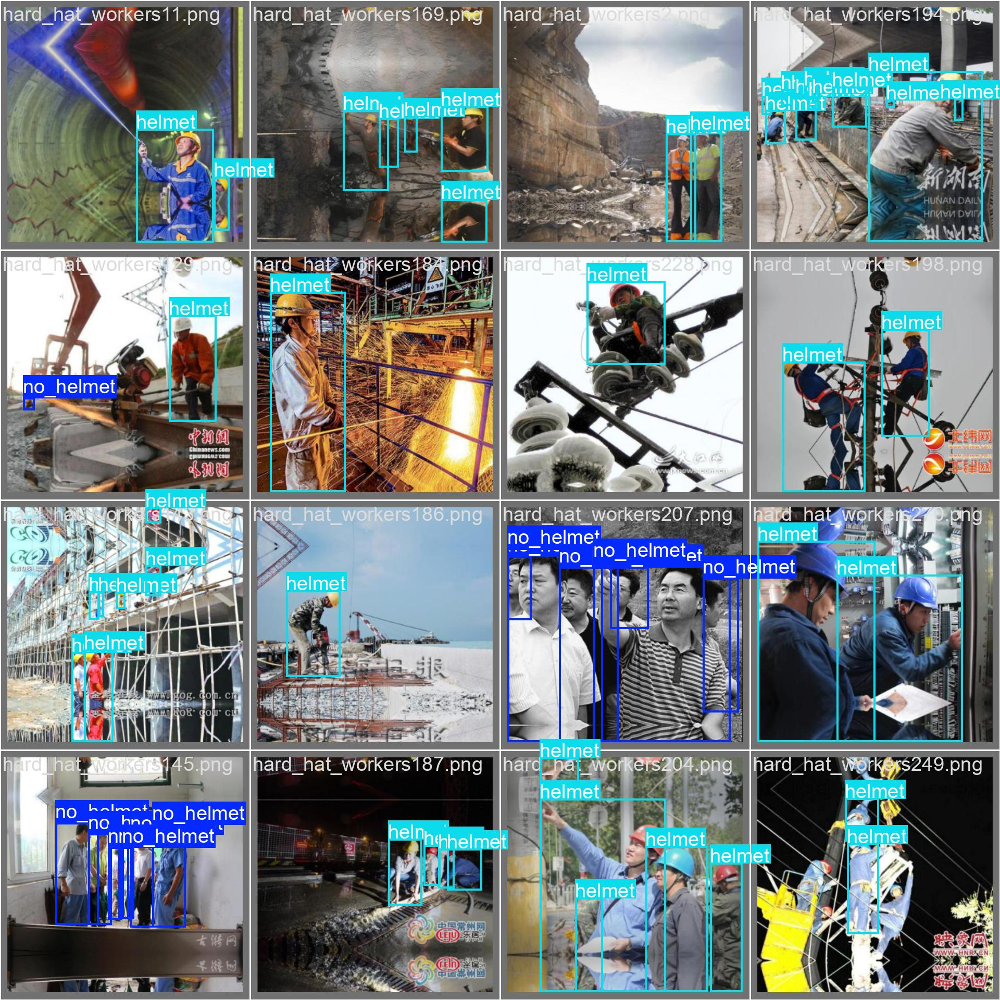

val_batch0_pred.jpg


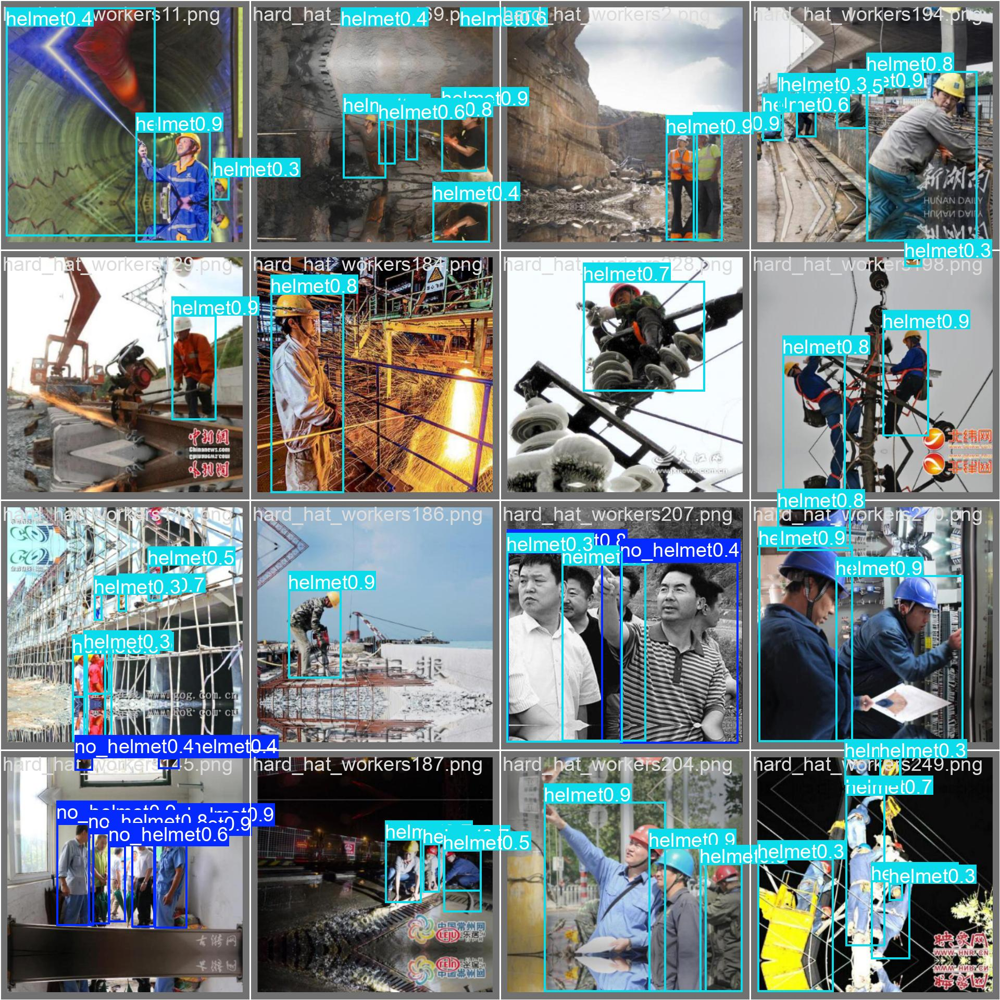

val_batch1_labels.jpg


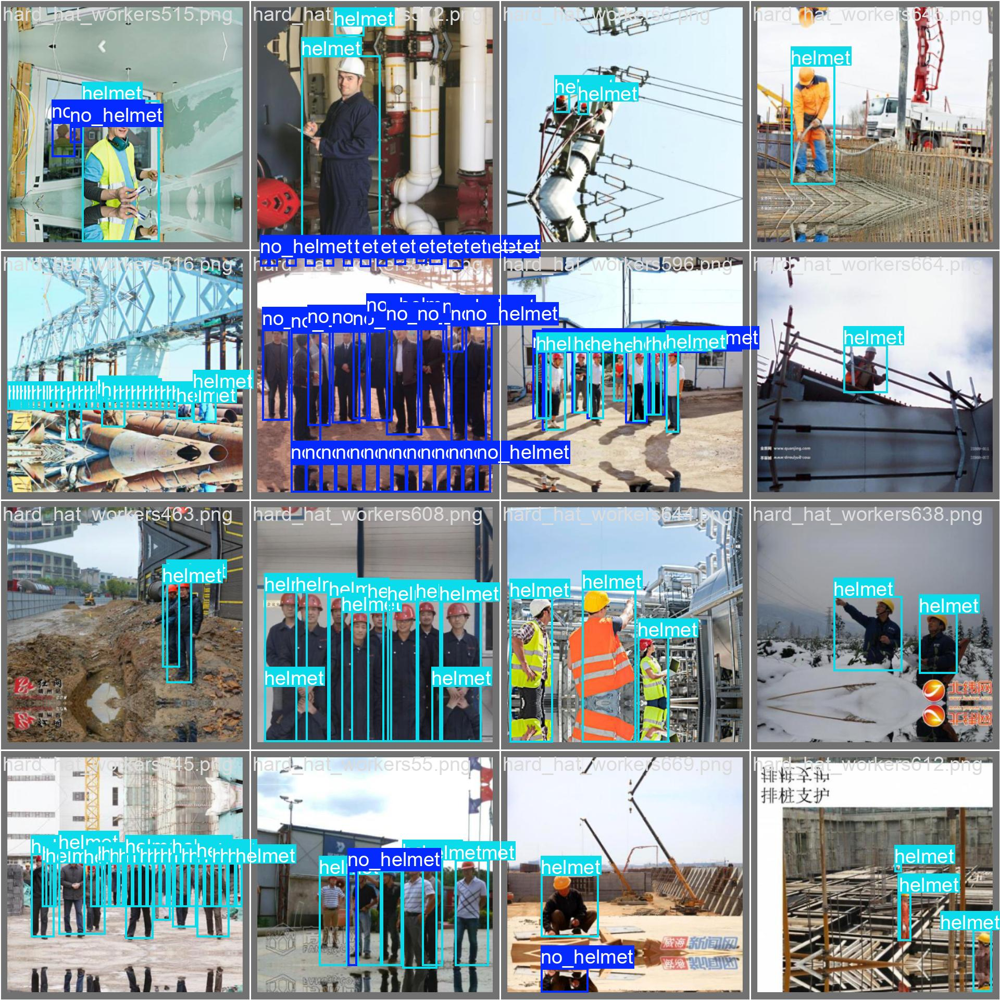

val_batch1_pred.jpg


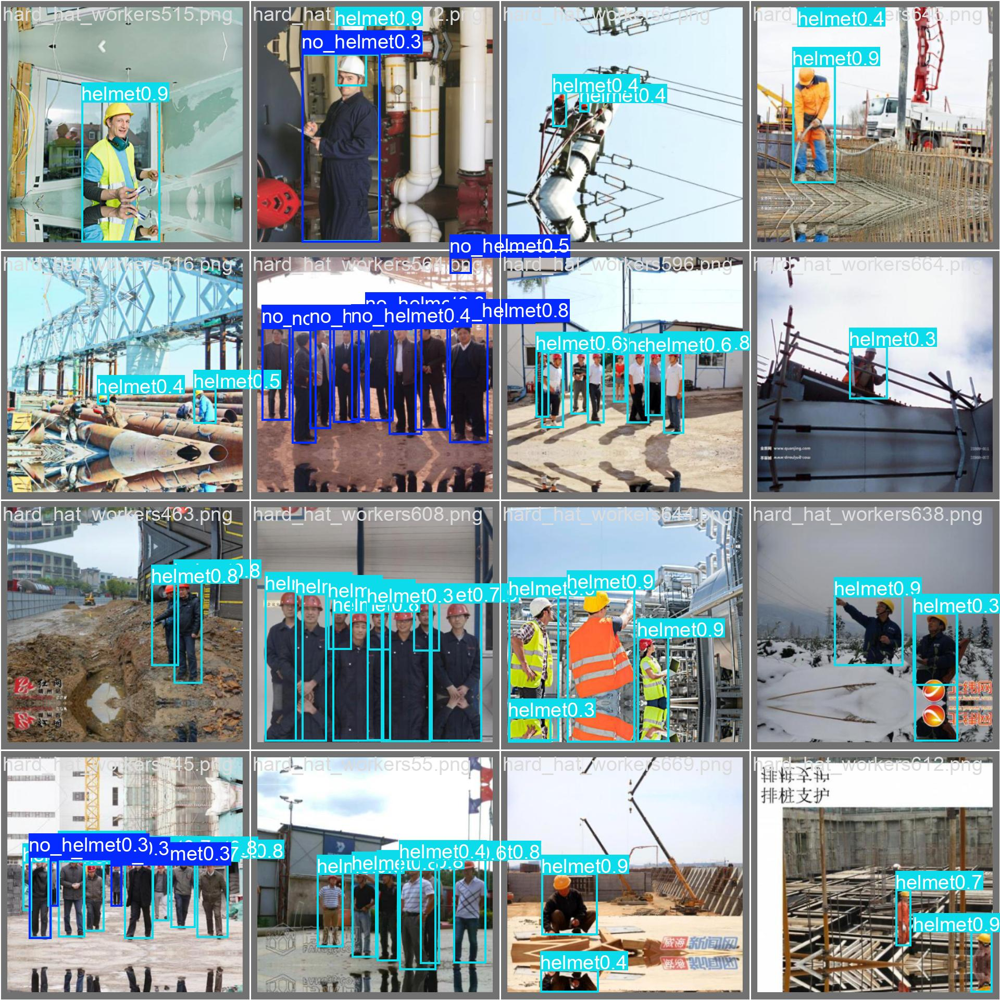

In [23]:
# Визуализируем результаты обучения
FP_DIR = ARTIFACTS_DIR / "fp_fn"
FP_DIR.mkdir(parents=True, exist_ok=True)

for name in ("val_batch0_labels.jpg", "val_batch0_pred.jpg", "val_batch1_labels.jpg", "val_batch1_pred.jpg"):
    src = RUN_DIR / name
    if src.exists():
        dest = ARTIFACTS_DIR / name
        shutil.copy2(src, dest)
        print(name)
        display(IPyImage(filename=str(dest)))

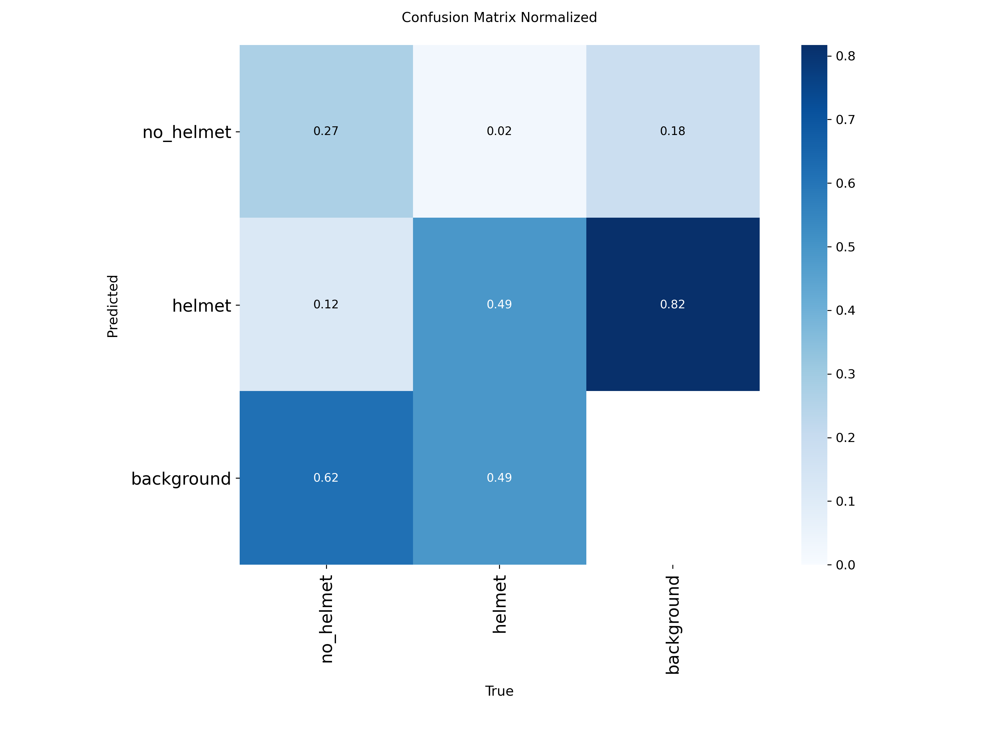

In [32]:
confusion_matrix_png = RUN_DIR / "confusion_matrix_normalized.png"
if confusion_matrix_png.exists():
    dest = ARTIFACTS_DIR / "confusion_matrix_normalized.png"
    shutil.copy2(confusion_matrix_png, dest)
    display(IPyImage(filename=str(dest)))

На основании Confusion matrix:
- `no_helmet`: только **27%** истиных срабатываний, **12%** путаются с `helmet`, **62%** ошибочно определяются как фон — основной провал это пропуски, не путаница классов
- `helmet`: **49%** истиных срабатываний и **49%** пропусков, всего **2%** ошибочно определяются как `no_helmet`
- среди ложных срабатываний на фон почти все — лишние `helmet` (82%)

In [24]:
def yolo_to_xyxy(parts, width, height):
    cls, cx, cy, bw, bh = map(float, parts)
    return int(cls), [
        (cx - bw / 2) * width,
        (cy - bh / 2) * height,
        (cx + bw / 2) * width,
        (cy + bh / 2) * height,
    ]


def box_iou(a, b):
    x1 = max(a[0], b[0])
    y1 = max(a[1], b[1])
    x2 = min(a[2], b[2])
    y2 = min(a[3], b[3])
    inter = max(0.0, x2 - x1) * max(0.0, y2 - y1)
    area_a = max(0.0, a[2] - a[0]) * max(0.0, a[3] - a[1])
    area_b = max(0.0, b[2] - b[0]) * max(0.0, b[3] - b[1])
    union = area_a + area_b - inter
    return inter / union if union else 0.0


def match_boxes(gt_boxes, pred_boxes, iou_thr=0.5):
    matched_gt = set()
    matched_pred = set()
    for i, (p_cls, p_box) in enumerate(pred_boxes):
        best_j, best_iou = -1, 0.0
        for j, (g_cls, g_box) in enumerate(gt_boxes):
            if j in matched_gt or g_cls != p_cls:
                continue
            iou = box_iou(p_box, g_box)
            if iou > best_iou:
                best_j, best_iou = j, iou
        if best_iou >= iou_thr:
            matched_pred.add(i)
            matched_gt.add(best_j)
    fps = [pred_boxes[i] for i in range(len(pred_boxes)) if i not in matched_pred]
    fns = [gt_boxes[j] for j in range(len(gt_boxes)) if j not in matched_gt]
    tps = [pred_boxes[i] for i in matched_pred]
    return tps, fps, fns


def draw_error_boxes(ax, boxes, color, caption):
    for cls, box in boxes:
        x1, y1, x2, y2 = box
        ax.add_patch(Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            fill=False, edgecolor=color, linewidth=2,
        ))
        ax.text(x1, y1, f"{caption} {CLASS_NAMES.get(cls, cls)}", color="white", fontsize=7, va="bottom",
                bbox={"facecolor": color, "edgecolor": "none", "alpha": 0.8, "pad": 1})

In [25]:
# отдельно покажем ошибки на валидационном датасете
WEIGHTS_PATH = RUN_DIR / "weights" / "best.pt"

model = YOLO(str(WEIGHTS_PATH))
val_images = sorted((OUTPUT_DIR / "images" / "val").glob("*.png"))[:12]

for img_path in val_images:
    pred = model.predict(img_path, verbose=False)[0]
    img = mpimg.imread(img_path)
    height, width = img.shape[:2]
    pred_boxes = []
    if pred.boxes is not None and len(pred.boxes):
        for box, cls in zip(pred.boxes.xyxy.cpu().numpy(), pred.boxes.cls.cpu().numpy()):
            pred_boxes.append((int(cls), box.tolist()))

    label_path = OUTPUT_DIR / "labels" / "val" / f"{img_path.stem}.txt"
    gt_boxes = []
    if label_path.exists():
        for line in label_path.read_text().splitlines():
            if line.strip():
                gt_boxes.append(yolo_to_xyxy(line.split(), width, height))

    tps, fps, fns = match_boxes(gt_boxes, pred_boxes)

    fig, ax = plt.subplots(figsize=(width / 100, height / 100), dpi=100)
    ax.imshow(img)
    ax.set_axis_off()
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    draw_error_boxes(ax, tps, "lime", "TP")
    draw_error_boxes(ax, fps, "red", "FP")
    draw_error_boxes(ax, fns, "orange", "FN")
    out_path = FP_DIR / f"{img_path.stem}_errors.png"
    fig.savefig(out_path, bbox_inches="tight", pad_inches=0)
    plt.close(fig)

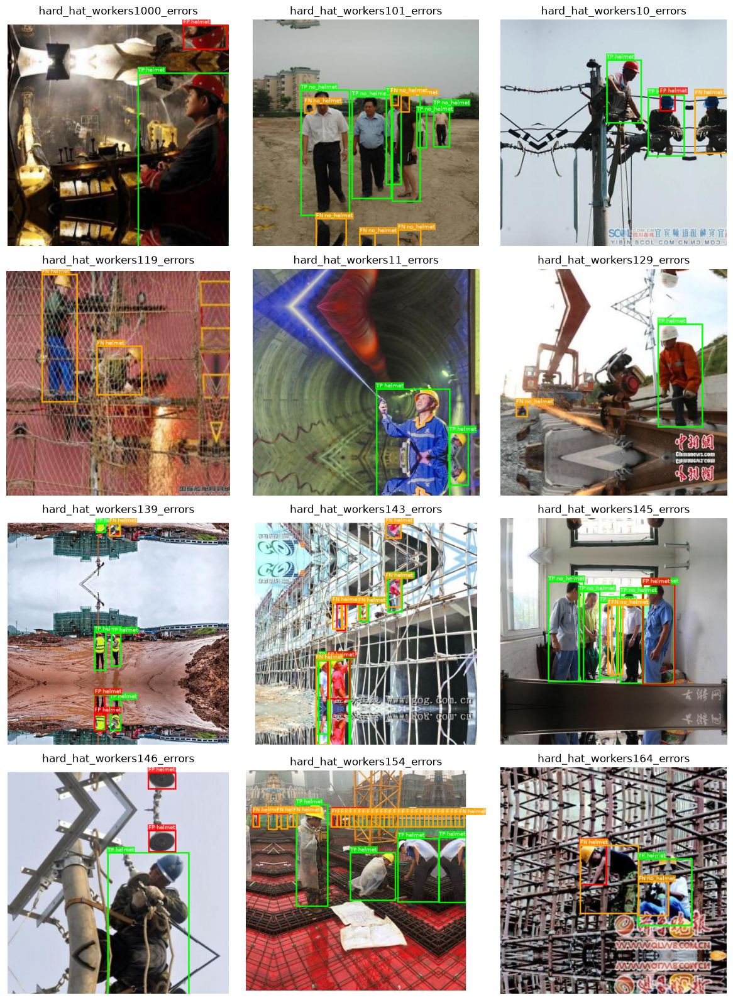

In [28]:
error_paths = sorted(FP_DIR.glob("*_errors.png"))

n = min(len(error_paths), 12)
cols = 3
rows = (n + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows))
axes = np.array(axes).reshape(-1)

for ax, path in zip(axes, error_paths[:n]):
    ax.imshow(mpimg.imread(path))
    ax.set_title(path.stem)
    ax.axis("off")

for ax in axes[n:]:
    ax.axis("off")

plt.tight_layout()
plt.savefig(ARTIFACTS_DIR / "fp_fn_grid.png")
plt.show()

На оверлях видно (зелёный TP, красный FP, оранжевый FN):
- крупные люди в каске часто опредяляются правильно
- отсутсвие срабатываний: ночь и туннель, мелкие фигуры на краю, шумные композиции
- ложно-положительные срабатывания: пустой фон и блики дубли на одном человеке
- часть ошибок разметки перешла от кривой разметки через VQA, которую детектор воспроизводит

## Итоговые выводы и предложения по улучшению

Собрали разметку с помощью VQA (`qwen/qwen3-vl-30b`) и дообучили детектор `YOLO`. Модель сходится и хорошо определяет крупных людей, особенно в каске.

По целевому классу `no_helmet` модель не слишком бдительна, а наоборот **часто допускает ошибку второго рода**. Из реальных людей без шлема она находит только 27%, ещё 12% путает с каской, 62% неверно определяет как фон. Ложных тревог мало: человек в каске становится `no_helmet` лишь в 2% случаев, а лишние боксы на фоне почти все — `helmet` (82%). Precision 0.68 при recall 0.38 это подтверждает.

Для улучшения результатов имело бы смысл лучше поработать с датасетом:
- расширение датасета через аугментации 
- ручная коррекция разметки человеком после VQA
- убрать слишком мелкие боксы и дубли
- поправить баланс классов: сейчас без шлема заметно реже людей в шлеме